In [1]:
import scanpy as sc
import scrublet as scr
import numpy as np
from matplotlib import pyplot as plt
import os
import pandas as pd
from scipy import io
import scipy
import harmonypy
#sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
np.random.seed(12345)
from cellbender.remove_background.downstream import anndata_from_h5

In [2]:
# set working dir 
os.chdir('/dfs7/swaruplab/smorabit/analysis/PiD_2021/snRNA/')
fig_dir = 'figures/'
data_dir = 'data/'

### Load the individual samples:

In [3]:


# directory with counts data
count_data_dir = '/dfs7/swaruplab/zechuas/Projects/AD_GM_WM_2022/snRNA_seq/rawdata/ParseBio/WT2_27samples/WT2_combined/'
#samples = [s for s in os.listdir(count_data_dir)]

samples = [x for x in os.listdir(count_data_dir) if os.path.isdir("{}/{}".format(count_data_dir, x))]
samples = [x for x in samples if "Ctrl" in x or "PiD" in x]
samples


#combine different samples into one merged adata object
adata_list = []
for sample in samples:
    cur_dir = count_data_dir + sample
    cur_file = '{}/DGE_unfiltered/cellbender_filtered.h5'.format(cur_dir)
    if not os.path.exists(cur_file):
        continue
    adata = anndata_from_h5(cur_file)
    adata.var_names_make_unique()
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    sc.pp.filter_cells(adata, min_counts = 250)
    adata.obs['orig_barcode'] = adata.obs.index
    adata.obs['SampleID'] = sample 
    adata_list.append(adata)
    print(sample, adata.shape)

Assuming we are loading a "filtered" file that contains only cells.
Ctrl_1 (4118, 62703)
Assuming we are loading a "filtered" file that contains only cells.
Ctrl_2 (22231, 62703)
Assuming we are loading a "filtered" file that contains only cells.
Ctrl_3 (14089, 62703)
Assuming we are loading a "filtered" file that contains only cells.
PiD_1 (4429, 62703)
Assuming we are loading a "filtered" file that contains only cells.
PiD_2 (22618, 62703)
Assuming we are loading a "filtered" file that contains only cells.
PiD_3 (6406, 62703)
Assuming we are loading a "filtered" file that contains only cells.
PiD_4 (5301, 62703)
Assuming we are loading a "filtered" file that contains only cells.
PiD_5 (8172, 62703)


In [4]:
# concatenate
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index
adata.shape

/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


(87364, 62703)

In [5]:
# reset the var table
var_df = pd.read_csv('/dfs7/swaruplab/zechuas/Projects/AD_GM_WM_2022/snRNA_seq/rawdata/ParseBio/WT2_27samples/WT2_combined/PiD_1/DGE_unfiltered/genes.tsv', sep='\t', header=None)
var_df.columns = ['gene_id', 'gene_symbol', 'genome']
var_df.head()
var_df.index = var_df.gene_symbol

adata.var = var_df


In [15]:
adata.var_names_make_unique()


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/utils.py:117: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD115-1', 'SNORD115-2', 'SNORD115-3', 'SNORD115-4', 'SNORD115-5']
  + str(example_colliding_values)


## add metadata

In [7]:
meta_df = pd.read_csv('{}/metadata.csv'.format(data_dir))
meta_df.head()

,IDtosnATAC,SampleID,Assignment,BrainBank,Case,Age,Sex,PMI,DX,Region
0,7,PiD_2,Group1,Harvard,S05563,63,M,26.75,Pick's disease,FCX
1,8,PiD_3,Group1,UCI ADRC,02 03,72,M,4.50,Pick's disease,FCX
2,9,Ctrl_2,Group1,Harvard,S14193,76,M,21.63,Control,FCX
3,11,PiD_4,Group1,UCI ADRC,28 00,76,F,3.30,Pick's disease,FCX
4,13,PiD_5,Group1,UCI ADRC,32 10,78,M,15.37,Pick's disease,FCX


In [8]:
# add the sample ID from the manifest file:
temp = adata.obs.merge(
    meta_df,
    how = 'left',
    left_on = 'SampleID',
    right_on = 'SampleID'
)
temp.index = temp.barcode
temp.head() 


adata.obs = temp
adata.obs.index.name = None

In [9]:
# write the unprocessed file
adata.write_h5ad("{}/PiD_unprocessed.h5ad".format(data_dir))

In [10]:
adata = sc.read_h5ad("{}/PiD_unprocessed.h5ad".format(data_dir))

/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Doublet detection:

In [11]:
# get a list of all the samples in our adata
samples = adata.obs.SampleID.unique().to_list()
obs_list = []

# loop through each sample and run Scrublet
for cur_sample in samples:
    print(cur_sample)
    cur_adata = adata[adata.obs.SampleID == cur_sample]
    scrub = scr.Scrublet(cur_adata.X)
    doublet_scores, predicted_doublets = scrub.scrub_doublets()
    cur_adata.obs['doublet_score'] = doublet_scores 
    cur_adata.obs['predicted_doublet'] = predicted_doublets
    obs_list.append(cur_adata.obs)

# concatenate the resutls into one table
doublet_df  = pd.concat(obs_list)
doublet_df = doublet_df.set_index('barcode')
adata.obs = adata.obs.set_index('barcode')

# merge with the doublet_df
temp = adata.obs.merge(
    doublet_df,
    on = 'barcode'
)
adata.obs['doublet_score'] = temp['doublet_score']
adata.obs['predicted_doublet'] = temp['predicted_doublet']
adata.obs['predicted_doublet'] = adata.obs['predicted_doublet'].astype("str")



Ctrl_1
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.31
Detected doublet rate = 4.7%
Estimated detectable doublet fraction = 32.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 14.7%
Elapsed time: 7.5 seconds
Ctrl_2


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.18
Detected doublet rate = 11.9%
Estimated detectable doublet fraction = 39.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 30.6%
Elapsed time: 34.9 seconds


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Ctrl_3
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.60
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 11.1%
Elapsed time: 18.0 seconds
PiD_1


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.70
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.9%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.6%
Elapsed time: 3.6 seconds
PiD_2


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.13
Detected doublet rate = 18.1%
Estimated detectable doublet fraction = 69.4%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 26.1%
Elapsed time: 34.4 seconds
PiD_3


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.18
Detected doublet rate = 14.8%
Estimated detectable doublet fraction = 64.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 22.8%
Elapsed time: 7.1 seconds
PiD_4
Preprocessing...


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.16
Detected doublet rate = 22.8%
Estimated detectable doublet fraction = 69.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 33.1%
Elapsed time: 4.6 seconds
PiD_5


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Elapsed time: 8.8 seconds


/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [12]:
# write the unprocessed file
adata.write_h5ad("{}/PiD_unprocessed_test.h5ad".format(data_dir))

In [13]:
# QC metrics
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [ ]:
adata.var_names_make_unique()

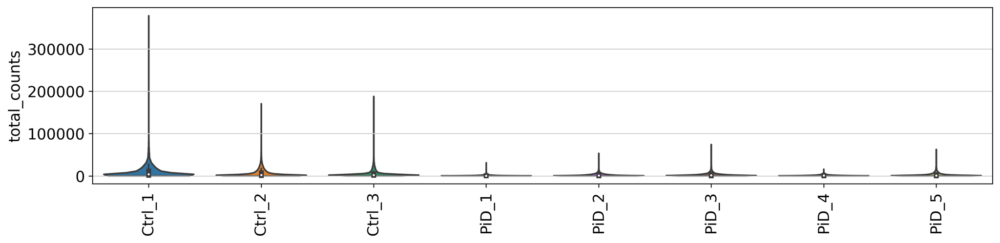

In [16]:
sc.settings.set_figure_params(dpi=150, dpi_save=300, figsize=(12,3), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='SampleID', multi_panel=False, rotation=90)


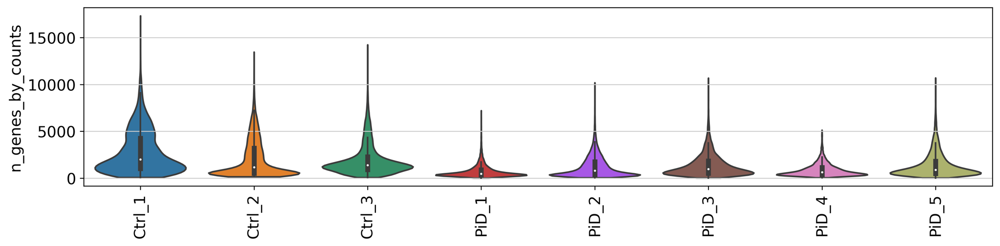

In [17]:
sc.settings.set_figure_params(dpi=150, dpi_save=300, figsize=(12,3), facecolor='white')
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='SampleID', multi_panel=False, rotation=90)


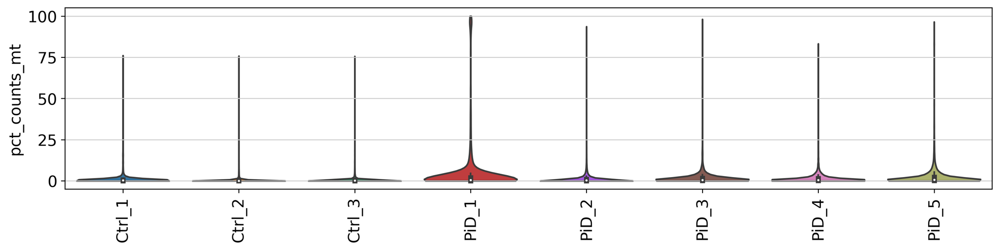

In [18]:
sc.settings.set_figure_params(dpi=150, dpi_save=300, figsize=(12,3), facecolor='white')
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='SampleID', multi_panel=False, rotation=90)


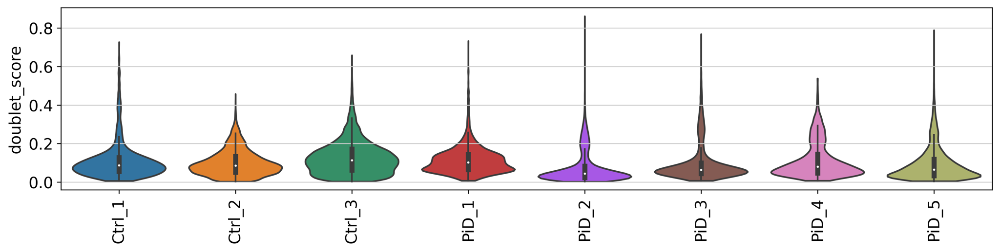

In [19]:
sc.settings.set_figure_params(dpi=150, dpi_save=300, figsize=(12,3), facecolor='white')
sc.pl.violin(adata,[ 'doublet_score'], inner='box', size=0,  groupby='SampleID', multi_panel=False, rotation=90)


In [20]:
adata.var.index.name = None

In [21]:
adata.var

,gene_id,gene_symbol,genome,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
TSPAN6,ENSG00000000003,TSPAN6,hg38,False,922,0.011412,98.944645,997.0
TNMD,ENSG00000000005,TNMD,hg38,False,33,0.000389,99.962227,34.0
DPM1,ENSG00000000419,DPM1,hg38,False,9983,0.153278,88.573096,13391.0
SCYL3,ENSG00000000457,SCYL3,hg38,False,5312,0.073486,93.919692,6420.0
C1orf112,ENSG00000000460,C1orf112,hg38,False,5228,0.078144,94.015842,6827.0
...,...,...,...,...,...,...,...,...
ENSG00000291297,ENSG00000291297,ENSG00000291297,hg38,False,23,0.000263,99.973673,23.0
ENSG00000291298,ENSG00000291298,ENSG00000291298,hg38,False,11,0.000126,99.987409,11.0
ENSG00000291299,ENSG00000291299,ENSG00000291299,hg38,False,2406,0.029486,97.246005,2576.0
PRSS30P-1,ENSG00000291300,PRSS30P,hg38,False,26,0.000298,99.970239,26.0


In [22]:
# write the file with the QC info but without any filtering
adata.write_h5ad("{}/PiD_unfiltered.h5ad".format(data_dir))

In [24]:
adata.obs.SampleID.unique().to_list()


['Ctrl_1', 'Ctrl_2', 'Ctrl_3', 'PiD_1', 'PiD_2', 'PiD_3', 'PiD_4', 'PiD_5']

## Apply QC filtering

In [ ]:
# write the file with the QC info but without any filtering
adata = sc.read_h5ad("{}/PiD_unfiltered.h5ad".format(data_dir))

In [25]:

mt_quantile = 0.95
umi_quantile = 0.95
doublet_quantile = 0.95

samples = adata.obs.SampleID.unique().to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.SampleID == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_score.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_score < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.index.to_list() 
    good_barcodes = good_barcodes + keep_cells
    n_removed = orig_cells-new_cells
    removed_percent = (n_removed / orig_cells) *100
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells, '(', removed_percent, '%)')

    

Ctrl_1 removed  585 , kept  3533 ( 14.20592520641088 %)
Ctrl_2 removed  2978 , kept  19253 ( 13.39570869506545 %)
Ctrl_3 removed  1885 , kept  12204 ( 13.37923202498403 %)
PiD_1 removed  659 , kept  3770 ( 14.879205238202756 %)
PiD_2 removed  3039 , kept  19579 ( 13.436201255637103 %)
PiD_3 removed  935 , kept  5471 ( 14.595691539182019 %)
PiD_4 removed  738 , kept  4563 ( 13.921901528013583 %)
PiD_5 removed  1189 , kept  6983 ( 14.54968184043074 %)


In [35]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)].copy()
adata.shape

(75356, 62703)

In [32]:
(adata.obs.total_counts > 20000).value_counts()

False    78259
True      9105
Name: total_counts, dtype: int64

In [34]:
(adata.obs.doublet_score > 0.2).value_counts()

False    76832
True     10532
Name: doublet_score, dtype: int64

In [33]:
adata.obs.predicted_doublet.value_counts()

False    70092
True      9100
None      8172
Name: predicted_doublet, dtype: int64

PiD_2     22618
Ctrl_2    22231
Ctrl_3    14089
PiD_5      8172
PiD_3      6406
PiD_4      5301
PiD_1      4429
Ctrl_1     4118
Name: SampleID, dtype: int64

In [36]:
adata = adata[adata.obs.pct_counts_mt < 5].copy()
adata = adata[adata.obs.doublet_score < 0.2].copy()
adata = adata[adata.obs.total_counts < 20000].copy()
adata.shape

(68999, 62703)

In [37]:
adata.obs.SampleID.value_counts()

PiD_2     18494
Ctrl_2    17989
Ctrl_3    10809
PiD_5      6211
PiD_3      5043
PiD_4      3967
PiD_1      3399
Ctrl_1     3087
Name: SampleID, dtype: int64

In [40]:
adata.write_h5ad("{}PiD_unprocessed.h5ad".format(data_dir))

## Initial pass with PCA, no extra QC

In [41]:
adata = sc.read_h5ad("{}/PiD_unprocessed.h5ad".format(data_dir))

In [42]:
adata.layers['counts'] = adata.X 

In [43]:
# normalize
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# retain the "Raw" adata object for later
adata.raw = adata


In [44]:
# identify HVGs
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=3000,
    layer="counts",
    subset=True,
)

/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  UserWarning,


In [45]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

In [46]:
sc.external.pp.harmony_integrate(adata, key = 'SampleID')


2024-01-23 15:37:24,768 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-01-23 15:37:52,052 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-01-23 15:37:52,456 - harmonypy - INFO - Iteration 1 of 10
2024-01-23 15:38:18,015 - harmonypy - INFO - Iteration 2 of 10
2024-01-23 15:38:43,324 - harmonypy - INFO - Iteration 3 of 10
2024-01-23 15:39:09,127 - harmonypy - INFO - Converged after 3 iterations


In [47]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

In [48]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [58]:
# clustering 
sc.tl.leiden(adata, resolution=3)
sc.tl.dendrogram(adata, 'leiden')

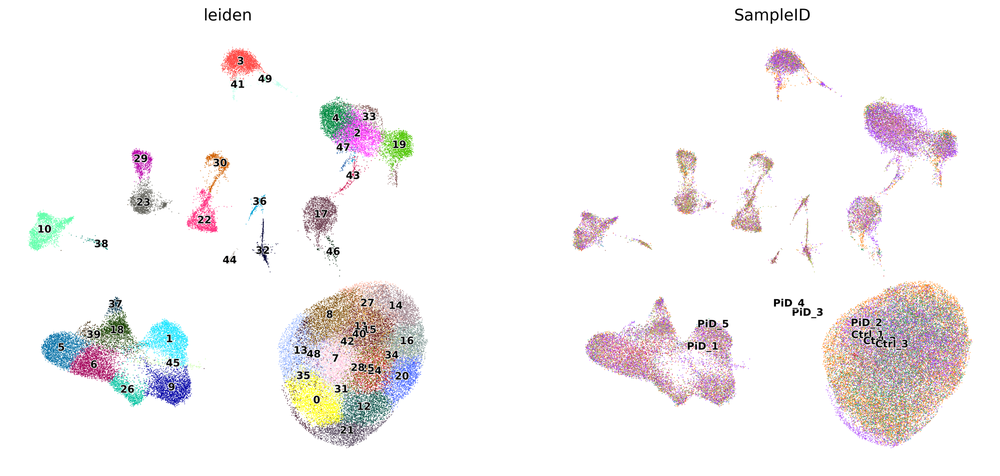

In [59]:

sc.settings.set_figure_params(dpi=150, dpi_save=500, figsize=(7,7), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden', 'SampleID'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    #title='',
    save='_leiden.pdf'
)


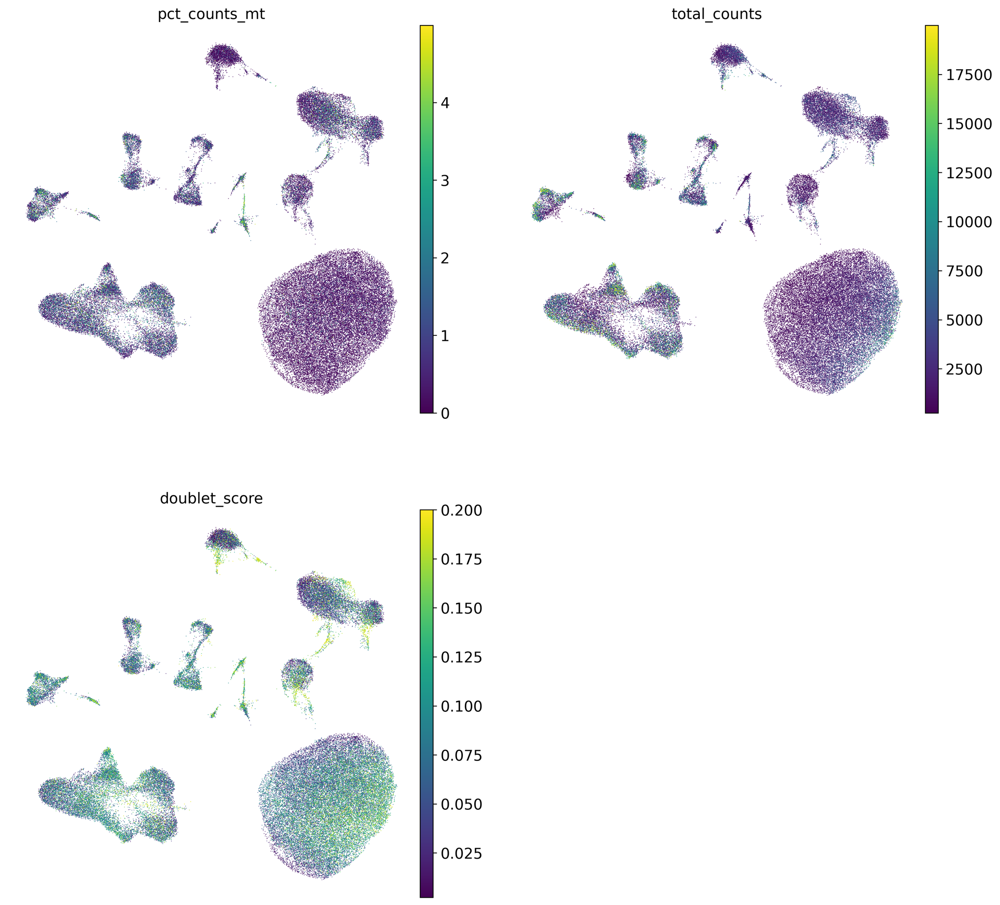

In [60]:
sc.pl.umap(
    adata, 
    color=['pct_counts_mt', 'total_counts', 'doublet_score'],
    frameon=False, 
   # legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=2
)


In [78]:
marker_dict = {
    'Oligodendrocyte': ['MOBP', 'MOG'],
    'Astrocyte': ['GFAP', 'AQP4'],
    'Microglia': ['CSF1R', 'CX3CR1',],
    'Vasculature': ['PDGFRB', 'FLT1'],
    'Pan-neuronal': ['SYT1'],
    'Excitatory Neuron': ['SLC17A7', 'SATB2', 'RORB', 'THEMIS', 'FEZF2'],
    'Inhibitory Neuron': ['GAD1', 'GAD2', 'PVALB', 'SST', 'VIP', 'LAMP5'],
    'Ependyma' : ['FOXJ1'], # not expressed
    'Oligodendrocyte Progenitor': ['PDGFRA', 'CSPG4']
}

categories: 0, 1, 2, etc.
var_group_labels: Oligodendrocyte, Astrocyte, Microglia, etc.


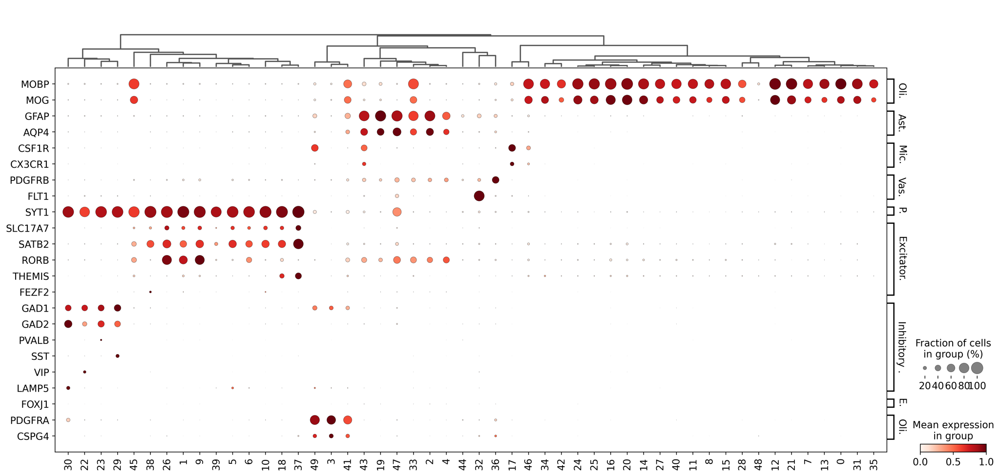

In [79]:
sc.settings.set_figure_params(dpi=200, dpi_save=500, figsize=(5,10), facecolor='white')
sc.pl.dotplot(
    adata, marker_dict, 'leiden', 
    dendrogram=True, 
    standard_scale='var', swap_axes=True,
    save = 'dotplot.pdf'
)

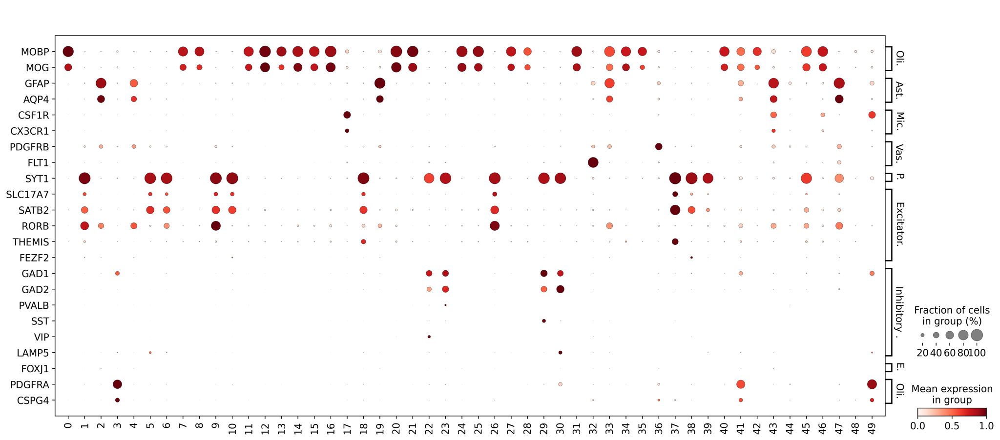

In [66]:
sc.settings.set_figure_params(dpi=200, dpi_save=500, figsize=(5,10), facecolor='white')
sc.pl.dotplot(
    adata, marker_dict, 'leiden', 
    dendrogram=False, 
    standard_scale='var', swap_axes=True,
    save = 'dotplot.pdf'
)

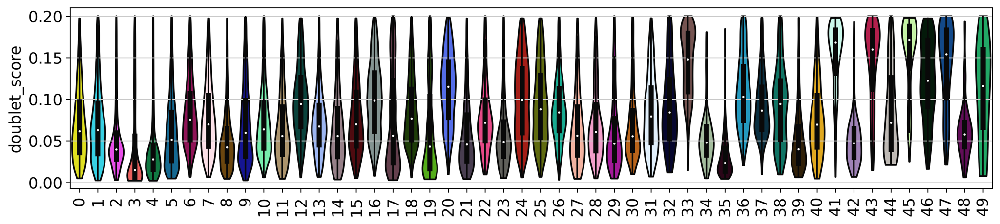

In [63]:
sc.settings.set_figure_params(dpi=150, dpi_save=300, figsize=(12,3), facecolor='white')
sc.pl.violin(adata,[ 'doublet_score'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)
#plt.savefig('{}/qc_counts.pdf'.format(fig_dir));


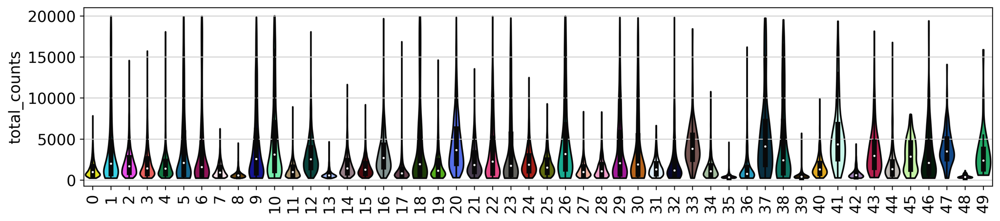

In [64]:
sc.settings.set_figure_params(dpi=150, dpi_save=300, figsize=(12,3), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)
#plt.savefig('{}/qc_counts.pdf'.format(fig_dir));


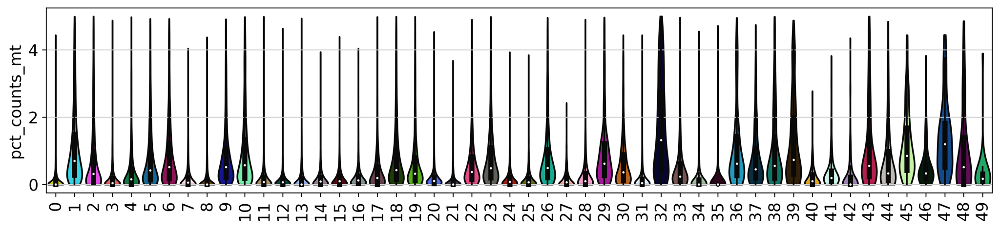

In [65]:
sc.settings.set_figure_params(dpi=150, dpi_save=300, figsize=(12,3), facecolor='white')
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)
#plt.savefig('{}/qc_counts.pdf'.format(fig_dir));


In [71]:
adata.obs.leiden.value_counts()

0     3083
1     2760
2     2745
3     2716
4     2656
5     2614
6     2614
7     2550
8     2412
9     2399
10    2303
11    2240
12    2192
13    2185
14    2101
15    2079
16    2053
17    2013
18    1984
19    1948
20    1840
21    1716
22    1708
23    1534
24    1380
25    1303
26    1117
27    1045
28    1014
29     977
30     929
31     850
32     627
33     604
34     597
35     568
36     471
37     401
38     373
39     341
40     314
41     289
42     273
43     239
44     219
45     181
46     160
47     144
48     106
49      32
Name: leiden, dtype: int64

In [69]:
# which clusters are we potentially removing?
clusters_to_remove = [
'48',
'44'
    
]

In [80]:
# write the file with the clustering
adata.write_h5ad("{}PiD_initial_clustering_01-23-24.h5ad".format(data_dir))

## Remove LQ clusters and perform subclustering

In [90]:
# write the file with the clustering
adata = sc.read_h5ad("{}PiD_initial_clustering_01-23-24.h5ad".format(data_dir))

In [91]:
# load cluster anno df 
anno_df = pd.read_csv(
    '{}PiD_leiden_celltypes.txt'.format(data_dir), sep='\t'
)

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')
adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()


In [92]:
# remove low quality (LQ) clusters
adata = adata[adata.obs.cell_type != 'LQ'].copy()
adata.shape

(66684, 3000)

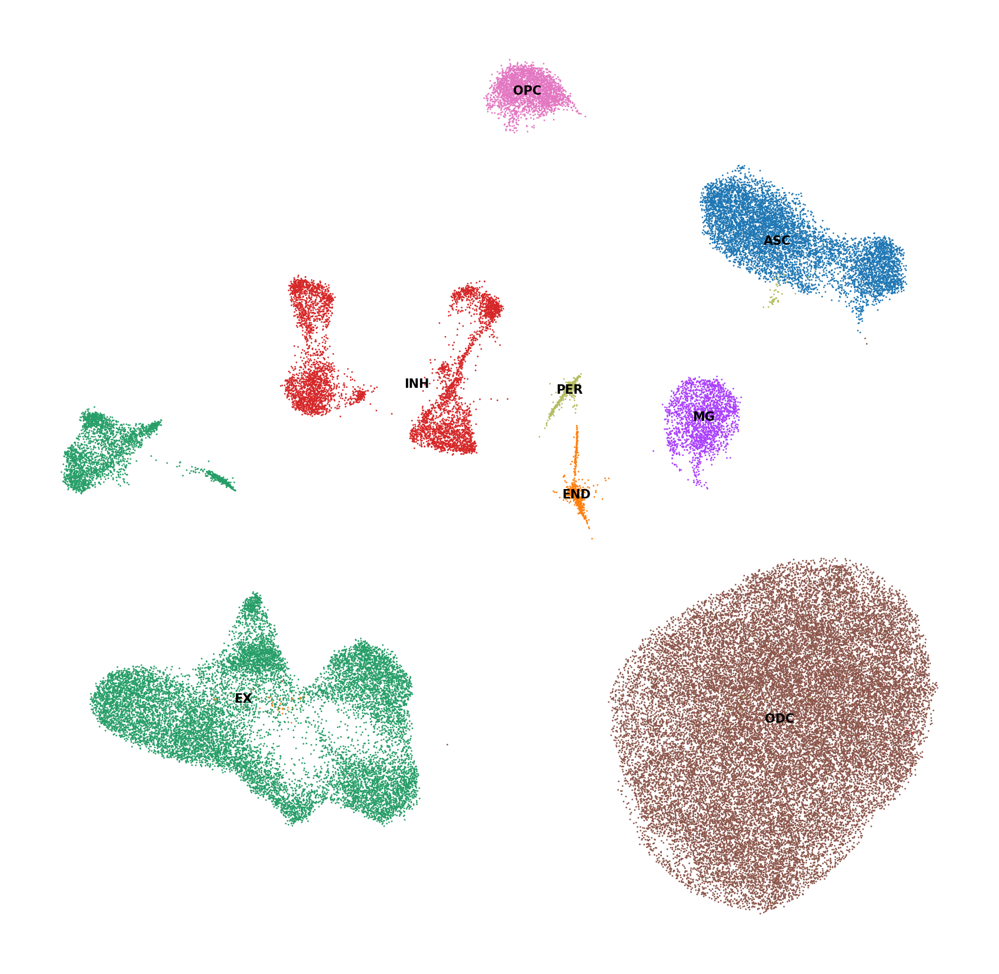

In [93]:
sc.settings.set_figure_params(dpi=150, figsize=(7,7), facecolor='white')
sc.pl.umap( 
    adata,
    color=["cell_type"], 
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data', 
    title=''
)


In [94]:
adata = adata.raw.to_adata()

### re-process after removing LQ clusters

In [100]:
# identify HVGs
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=3000,
    subset=True,
)

/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  UserWarning,


In [101]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

In [103]:
sc.external.pp.harmony_integrate(adata, key = 'SampleID')


2024-01-23 16:33:23,383 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-01-23 16:33:49,480 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-01-23 16:33:49,868 - harmonypy - INFO - Iteration 1 of 10
2024-01-23 16:34:11,581 - harmonypy - INFO - Iteration 2 of 10
2024-01-23 16:34:33,394 - harmonypy - INFO - Iteration 3 of 10
2024-01-23 16:34:55,076 - harmonypy - INFO - Converged after 3 iterations


In [104]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

In [105]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

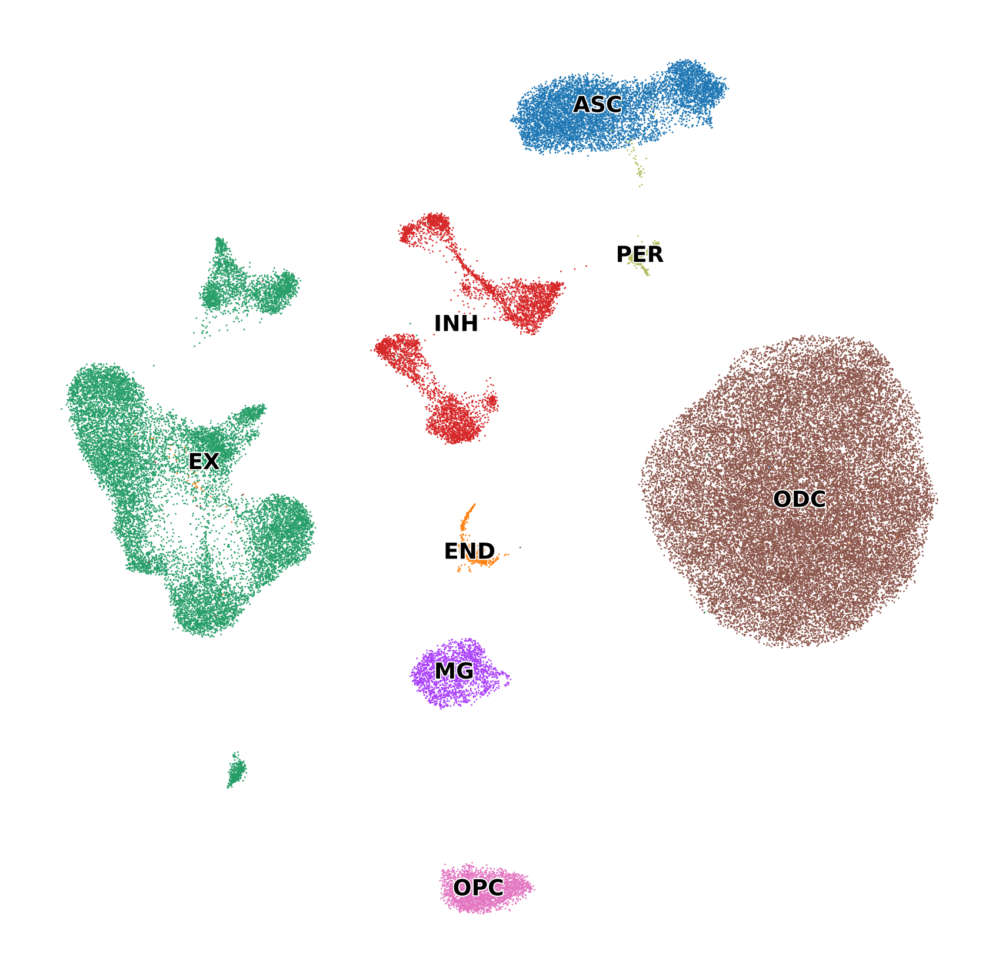

In [107]:

sc.settings.set_figure_params(dpi=150, dpi_save=500, figsize=(7,7), facecolor='white')
sc.pl.umap(
    adata, 
    color=['cell_type'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden.pdf'
)


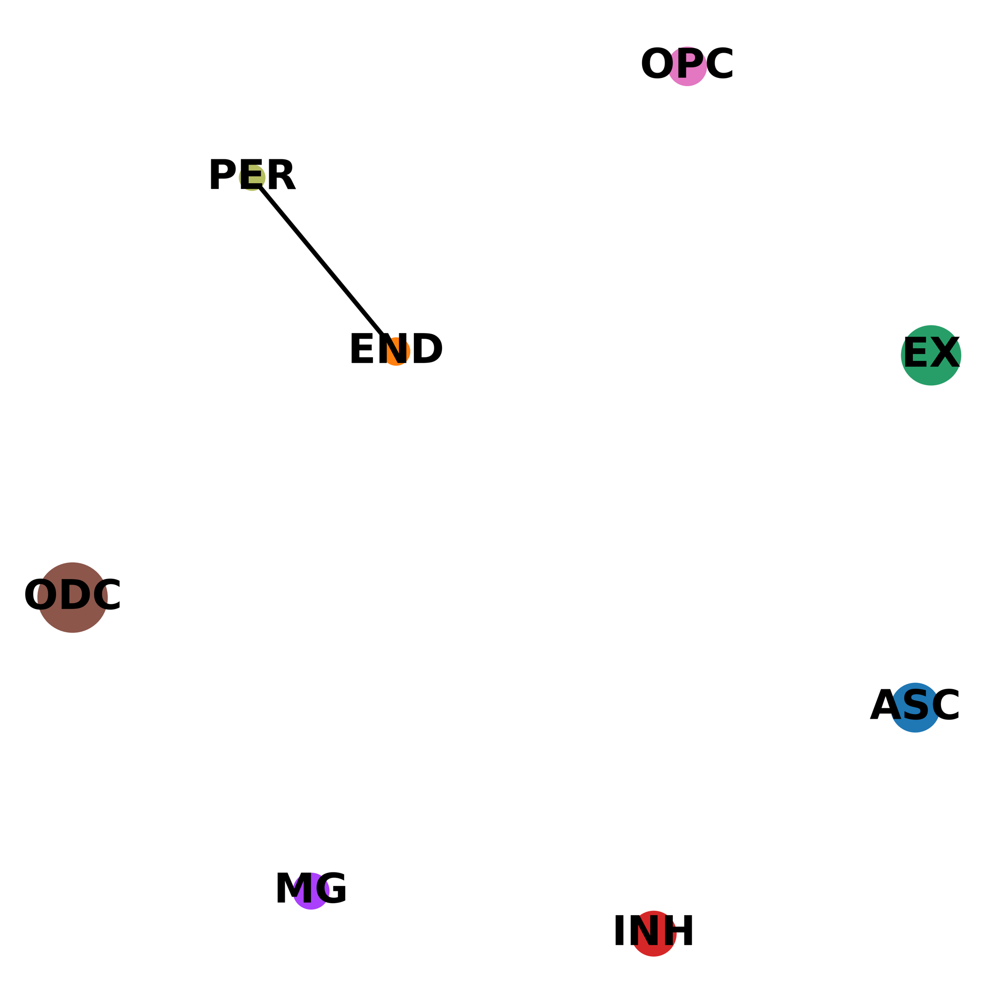

In [110]:
sc.settings.set_figure_params(dpi=500, dpi_save=200, figsize=(5,5), facecolor='white')
sc.tl.paga(adata, groups='cell_type')
sc.pl.paga(
    adata, threshold=0.2, title='', edge_width_scale=0.5,
    frameon=False, save=True
)

In [111]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.25, init_pos='paga')

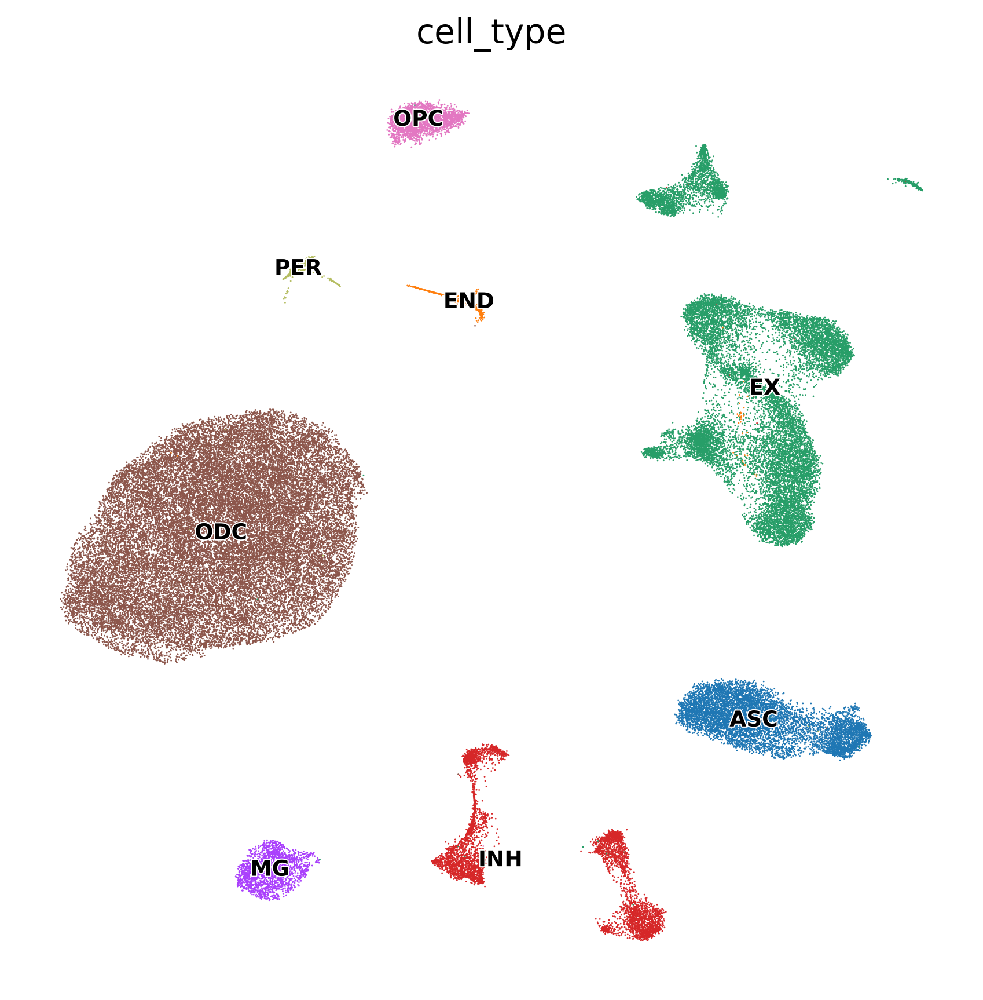

In [116]:

sc.settings.set_figure_params(dpi=150, dpi_save=500, figsize=(7,7), facecolor='white')
sc.pl.umap(
    adata, 
    color=['cell_type'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    save='_leiden.pdf'
)


In [114]:
adata.obs[adata.obs.DX == 'Control'].cell_type.value_counts()

ODC    21971
EX      3823
ASC     1743
INH     1643
OPC     1293
MG       661
PER       60
END       55
Name: cell_type, dtype: int64

In [115]:
adata.obs[adata.obs.DX == "Pick's disease"].cell_type.value_counts()

EX     12742
ODC     9824
ASC     5606
INH     3505
OPC     1423
MG      1352
END      572
PER      411
Name: cell_type, dtype: int64

In [117]:
adata.obs.DX.value_counts()

Pick's disease    35435
Control           31249
Name: DX, dtype: int64

In [118]:
adata.obs.SampleID.value_counts()

Ctrl_2    17601
PiD_2     17482
Ctrl_3    10686
PiD_5      6085
PiD_3      4786
PiD_4      3814
PiD_1      3268
Ctrl_1     2962
Name: SampleID, dtype: int64

In [119]:
adata.write_h5ad("{}/PiD_processed.h5ad".format(data_dir))

### EX subclustering

In [180]:
adata = sc.read_h5ad("{}/PiD_processed.h5ad".format(data_dir))


In [155]:
# # re-load unfiltered data:
# adata_unf = sc.read_h5ad('{}/PiD_unfiltered.h5ad'.format(data_dir))
# adata_unf = adata_unf[adata.obs.index].copy()

In [156]:
#adata.raw = adata_unf
#adata = adata.raw.to_adata()
#adata.shape

In [157]:
# adata_unf.obs = adata.obs
# adata_unf.obsm = adata.obsm
# adata = adata.raw.to_adata()
# adata.shape

/pub/smorabit/miniconda3/envs/cellbender/lib/python3.7/site-packages/anndata/_core/raw.py:146: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  uns=self._adata.uns.copy(),


(66684, 62703)

In [181]:
# subset EX
cur_celltype = 'EX'
cur_adata = adata[adata.obs.cell_type == cur_celltype].copy()


In [182]:


# clustering 
sc.tl.leiden(cur_adata, resolution=0.5)
sc.tl.dendrogram(cur_adata, 'leiden')

In [183]:
# remove clusters smaller than 50 cells:
small_clusters = cur_adata.obs.leiden.value_counts()
small_clusters = small_clusters[small_clusters < 50].index.to_list()

# remove the clusters
cur_adata = cur_adata[~cur_adata.obs.leiden.isin(small_clusters)].copy()


In [ ]:
# number the clusters
cluster_num = cur_adata.obs.leiden.astype(int) + 1
cur_adata.obs['annotation'] = cur_adata.obs.cell_type.astype(str) + cluster_num.astype(str)

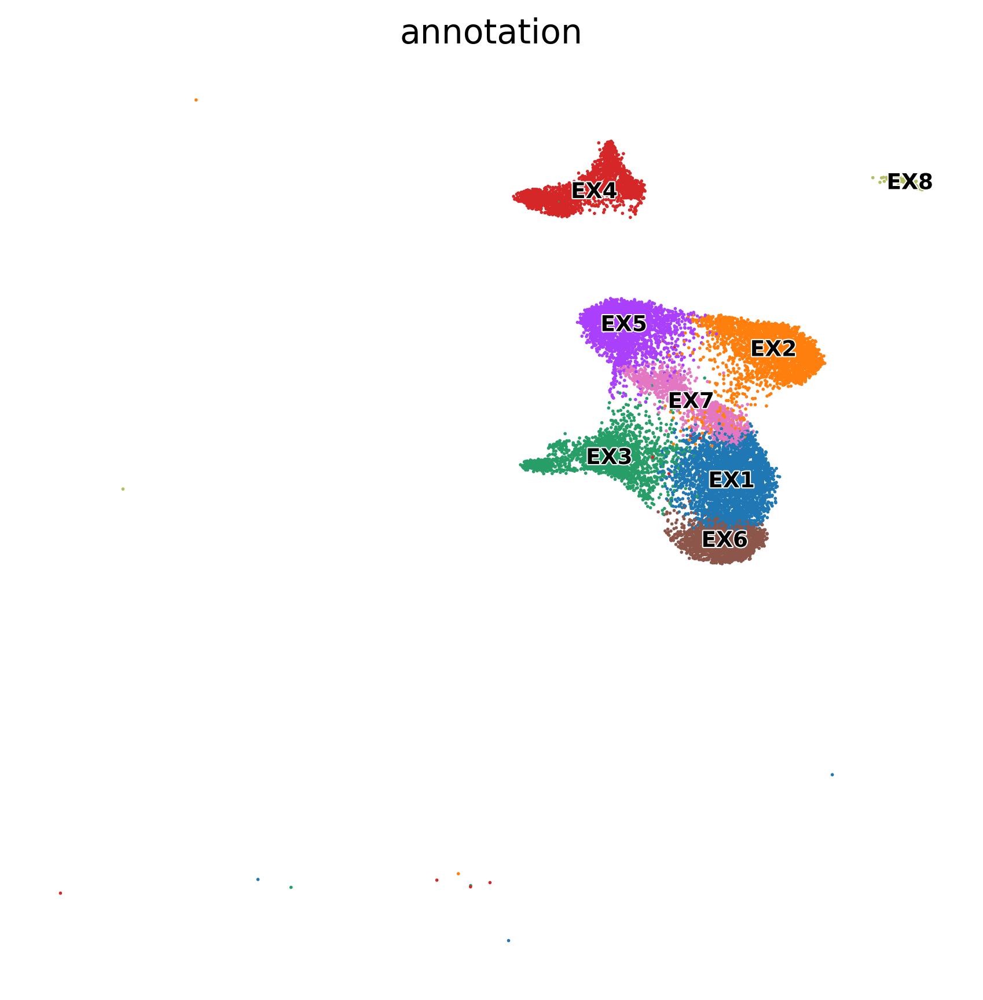

In [194]:

sc.settings.set_figure_params(dpi=150, dpi_save=500, figsize=(7,7), facecolor='white')
sc.pl.umap(
    cur_adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    save='_leiden.pdf'
)


In [195]:
adata_ex = cur_adata

### subset INH

In [219]:
# subset INH
cur_celltype = 'INH'
cur_adata = adata[adata.obs.cell_type == cur_celltype].copy()


In [220]:


# clustering 
sc.tl.leiden(cur_adata, resolution=0.5)
sc.tl.dendrogram(cur_adata, 'leiden')


In [221]:

# remove clusters smaller than 50 cells:
small_clusters = cur_adata.obs.leiden.value_counts()
small_clusters = small_clusters[small_clusters < 50].index.to_list()

# remove the clusters
cur_adata = cur_adata[~cur_adata.obs.leiden.isin(small_clusters)].copy()


In [222]:
# number the clusters
cluster_num = cur_adata.obs.leiden.astype(int) + 1
cur_adata.obs['annotation'] = cur_adata.obs.cell_type.astype(str) + cluster_num.astype(str)

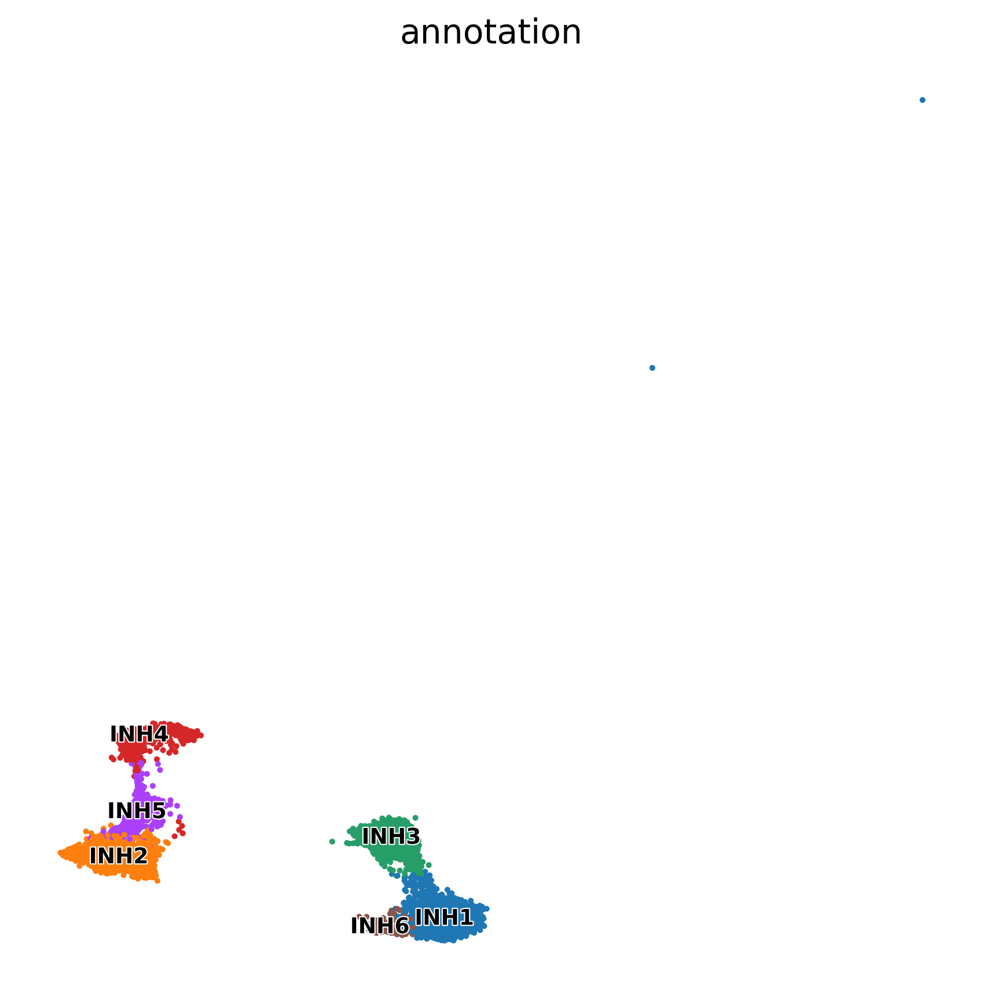

In [223]:

sc.settings.set_figure_params(dpi=150, dpi_save=500, figsize=(7,7), facecolor='white')
sc.pl.umap(
    cur_adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    save='_leiden.pdf'
)


In [224]:
adata_inh = cur_adata

## subset ASC

In [201]:
# subset INH
cur_celltype = 'ASC'
cur_adata = adata[adata.obs.cell_type == cur_celltype].copy()


In [206]:


# clustering 
sc.tl.leiden(cur_adata, resolution=0.25)
sc.tl.dendrogram(cur_adata, 'leiden')



In [207]:

# remove clusters smaller than 50 cells:
small_clusters = cur_adata.obs.leiden.value_counts()
small_clusters = small_clusters[small_clusters < 50].index.to_list()

# remove the clusters
cur_adata = cur_adata[~cur_adata.obs.leiden.isin(small_clusters)].copy()


In [208]:

# number the clusters
cluster_num = cur_adata.obs.leiden.astype(int) + 1
cur_adata.obs['annotation'] = cur_adata.obs.cell_type.astype(str) + cluster_num.astype(str)

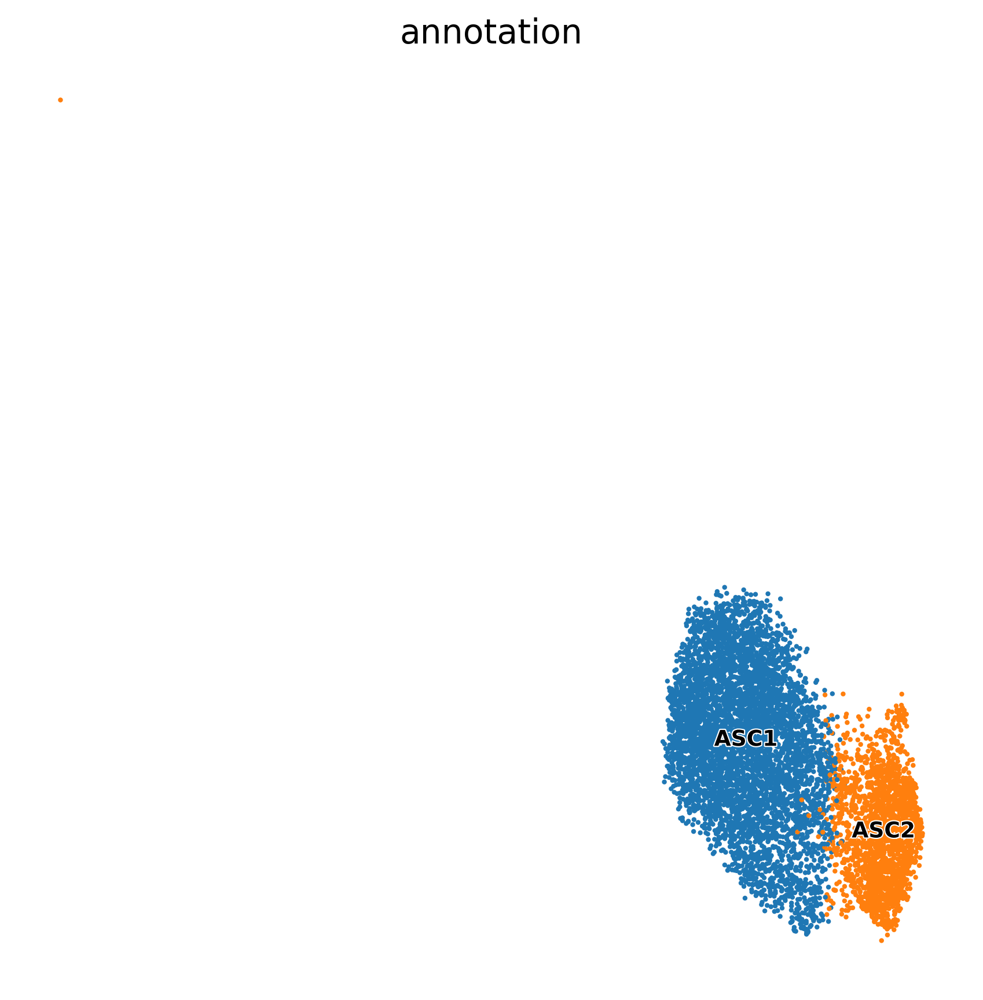

In [209]:

sc.settings.set_figure_params(dpi=150, dpi_save=500, figsize=(7,7), facecolor='white')
sc.pl.umap(
    cur_adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    save='_leiden.pdf'
)


In [211]:
adata_asc = cur_adata

### subset ODC

In [212]:
# subset INH
cur_celltype = 'ODC'
cur_adata = adata[adata.obs.cell_type == cur_celltype].copy()


In [213]:


# clustering 
sc.tl.leiden(cur_adata, resolution=0.25)
sc.tl.dendrogram(cur_adata, 'leiden')


# remove clusters smaller than 50 cells:
small_clusters = cur_adata.obs.leiden.value_counts()
small_clusters = small_clusters[small_clusters < 50].index.to_list()

# remove the clusters
cur_adata = cur_adata[~cur_adata.obs.leiden.isin(small_clusters)].copy()

# number the clusters
cluster_num = cur_adata.obs.leiden.astype(int) + 1
cur_adata.obs['annotation'] = cur_adata.obs.cell_type.astype(str) + cluster_num.astype(str)

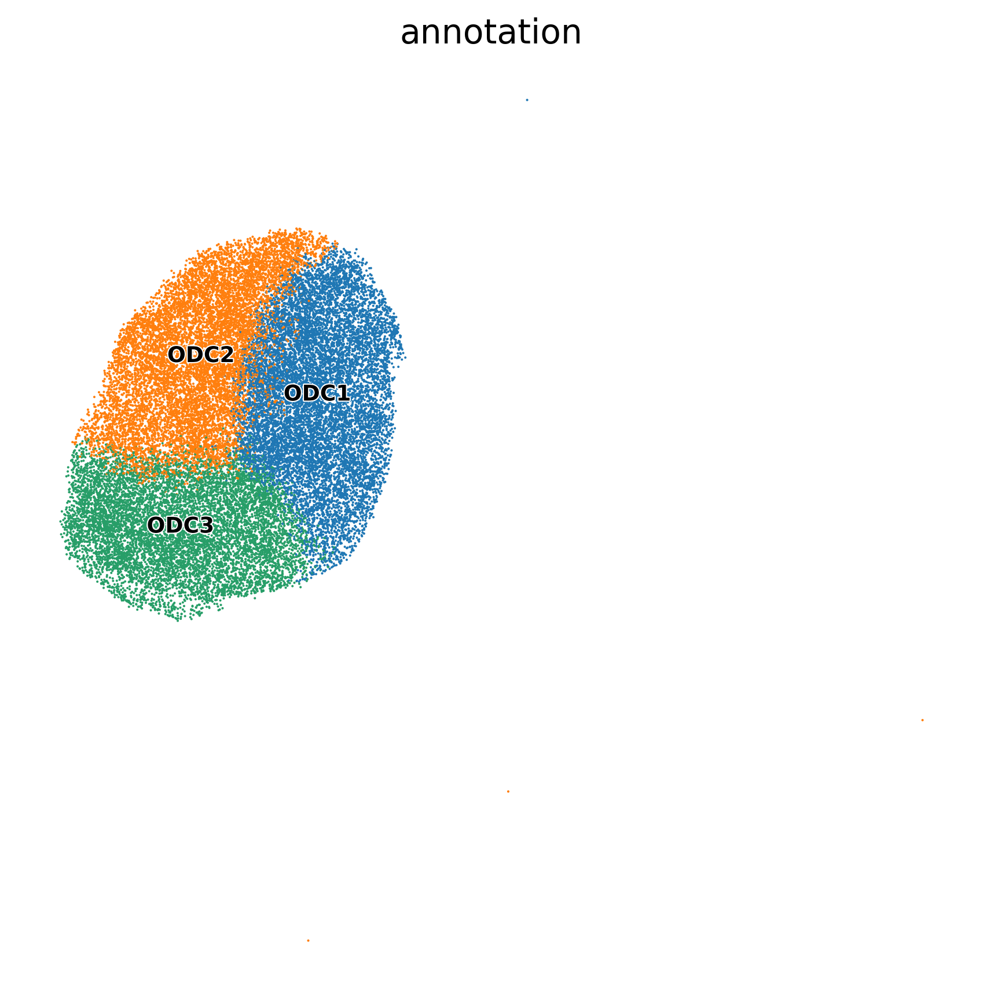

In [214]:

sc.settings.set_figure_params(dpi=150, dpi_save=500, figsize=(7,7), facecolor='white')
sc.pl.umap(
    cur_adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    save='_leiden.pdf'
)


In [215]:
adata_odc = cur_adata

### merge the annotations

In [228]:
adata_other = adata[~adata.obs.cell_type.isin(['EX', 'INH', 'ASC', 'ODC'])].copy()
adata_other.obs['annotation'] = adata_other.obs.cell_type

In [229]:

columns = ['cell_type', 'annotation']

anno_df = pd.concat([
    adata_other.obs[columns],
    adata_odc.obs[columns],
    adata_asc.obs[columns],
    adata_ex.obs[columns],
    adata_inh.obs[columns]
])
anno_df.shape

(66661, 2)

In [230]:
# subset
adata = adata[anno_df.index].copy()
adata.shape

(66661, 3000)

In [231]:
adata.obs['annotation'] = anno_df['annotation']

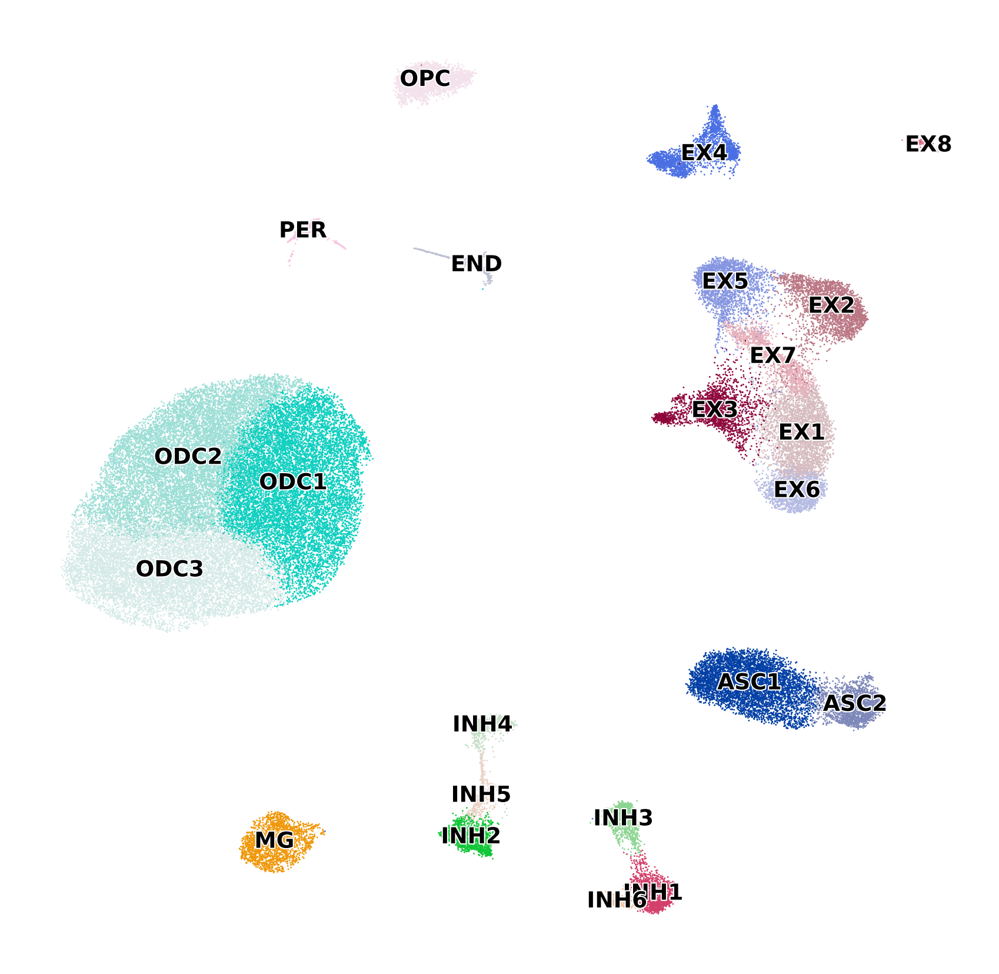

In [232]:

sc.settings.set_figure_params(dpi=150, dpi_save=500, figsize=(7,7), facecolor='white')
sc.pl.umap(
    adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title=''
   # save='_vis.pdf'
)


In [233]:
# write the file with the clustering
adata.write_h5ad("{}PiD_snRNA_01-24-24.h5ad".format(data_dir))

### saving

In [ ]:
# re-load
adata = sc.read_h5ad("{}PiD_snRNA_01-24-24.h5ad".format(data_dir))

In [241]:
# save the counts matrix:
adata_unf = sc.read_h5ad('{}/PiD_unfiltered.h5ad'.format(data_dir))
adata_unf = adata_unf[adata.obs.index].copy()
X_counts = adata_unf.X
X_counts = scipy.sparse.csr_matrix.transpose(X_counts)
io.mmwrite('{}PiD_snRNA_processed_counts.mtx'.format(data_dir), X_counts)


In [236]:
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]

In [237]:
# write the obs table
adata.obs.to_csv('{}/PiD_snRNA_processed_obs.csv'.format(data_dir))

In [238]:
# write the latent representation:
pd.DataFrame(adata.obsm['X_pca_harmony']).to_csv('{}PiD_snRNA_processed_harmony.csv'.format(data_dir))


In [240]:
# write the var table
adata_unf.var.to_csv('{}/PiD_snRNA_processed_var.csv'.format(data_dir))